In [1]:
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import rasterio

from scipy.ndimage import label, find_objects, binary_closing
from matplotlib.patches import Rectangle

In [3]:
#SCENE_INDEX = 0

path = r".\data\commercial_cog_subset\ship_subset.tif" 

with rasterio.open(path) as src:
    arr = src.read(1)
    meta = {
        "width": src.width,
        "height": src.height,
        "count": src.count,
        "dtype": src.dtypes,
        "crs": src.crs,
        "resolution": src.res,
        "bounds": src.bounds,
        "nodata": src.nodata,
    }

print()
for k, v in meta.items():
    print(f"{k}: {v}")

print("Array shape:", arr.shape)
print("Array dtype:", arr.dtype)
print("Min/max:", np.nanmin(arr), np.nanmax(arr))

nodata = meta["nodata"] if meta["nodata"] is not None else 0
valid = np.isfinite(arr) & (arr != nodata)
print("Valid percentiles:", np.nanpercentile(arr[valid], [1, 50, 95, 99, 99.8, 99.9]))


width: 9381
height: 8141
count: 1
dtype: ('uint8',)
crs: EPSG:32618
resolution: (0.34999999999999054, 0.34999999999999054)
bounds: BoundingBox(left=579373.1451899222, bottom=4500843.217511419, right=582656.495189922, top=4503692.567511419)
nodata: 0.0
Array shape: (8141, 9381)
Array dtype: uint8
Min/max: 1 255
Valid percentiles: [  1.  22.  72.  85. 136. 158.]


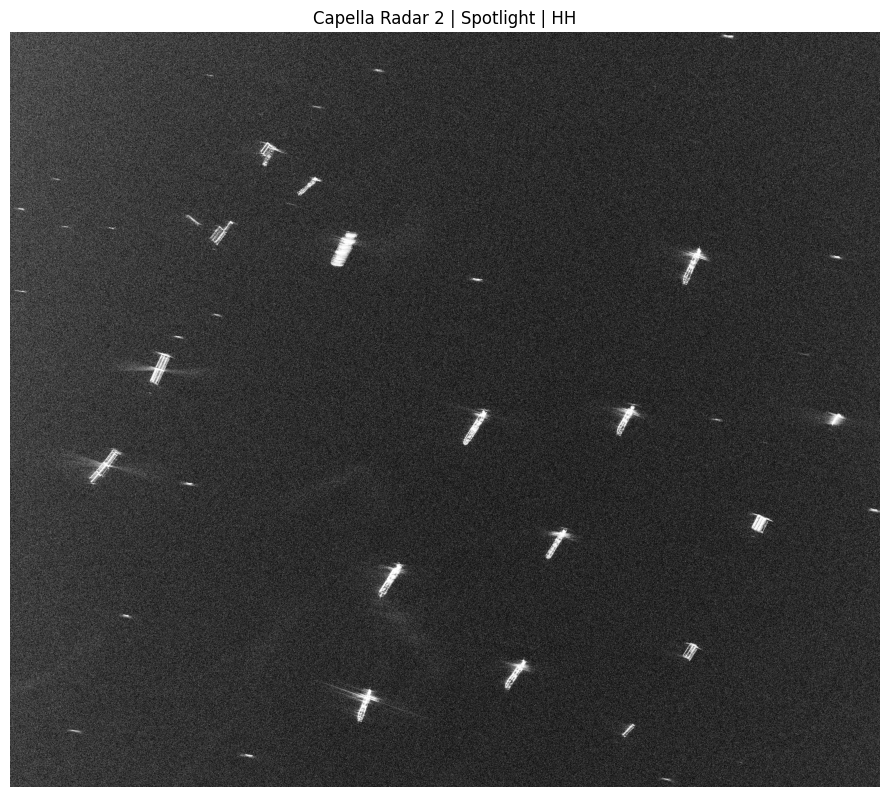

In [4]:
def display_sar(arr, pmin=1, pmax=99.8, nodata=0):
    img = arr.astype("float32").copy()
    if nodata is not None:
        img[img == nodata] = np.nan

    finite = np.isfinite(img)
    if not finite.any():
        return np.zeros_like(img, dtype="float32")

    lo, hi = np.nanpercentile(img[finite], [pmin, pmax])
    return np.clip((img - lo) / (hi - lo + 1e-9), 0, 1)

def plot_sar(arr, title="", pmin=1, pmax=99.8, nodata=0, figsize=(9, 9)):
    disp = display_sar(arr, pmin=pmin, pmax=pmax, nodata=nodata)
    plt.figure(figsize=figsize)
    plt.imshow(disp, cmap="gray")
    plt.title(title)
    plt.axis("off")
    plt.tight_layout()
    plt.show()

plot_sar(arr, title=f"Capella Radar 2 | Spotlight | HH", nodata=nodata)

Questions
1. Identify several bright targets that are likely ships.
2. Do all ships appear as single blobs? 
QUESTION (5 pts):Zoom in very closely to some large ships in your GIS program. Do all ships still appear as single blobs? What might be some difficulty in designing a detector that can isolate single ships vs multiple clustered ships?

ANSWER: No, when zoomed in closely, ships do not always appear as single blobs; they often break into multiple bright scatterers or irregular patterns due to ship structure and SAR speckle. A key difficulty in designing a detector is that one ship may be split into several disconnected bright regions, while multiple nearby ships can merge into one cluster, making simple blob-based separation unreliable.

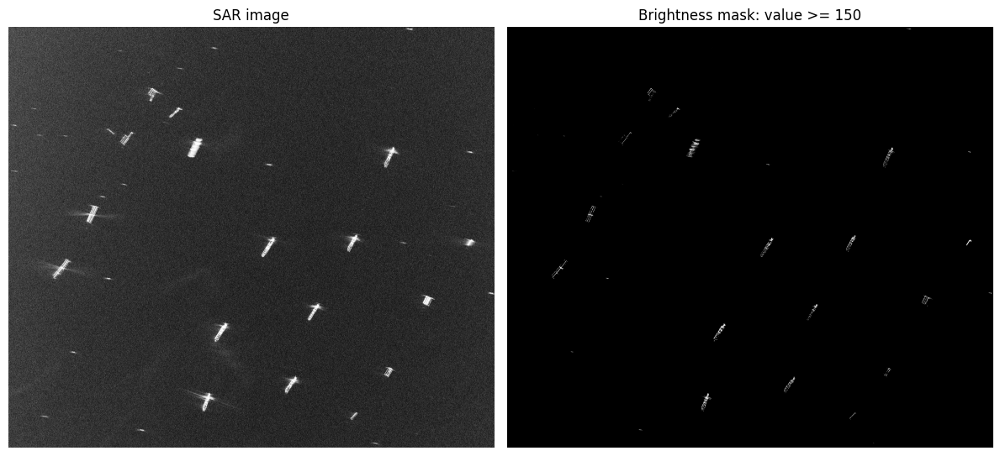

Pixels above threshold: 103976
Fraction of valid pixels above threshold: 0.0013614641663524428


In [5]:
def plot_threshold_mask(arr, threshold, nodata=0, pmin=1, pmax=99.8):
    img = arr.astype("float32")
    valid = np.isfinite(img)
    if nodata is not None:
        valid &= img != nodata
    mask = (img >= threshold) & valid

    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    axes[0].imshow(display_sar(arr, pmin=pmin, pmax=pmax, nodata=nodata), cmap="gray")
    axes[0].set_title("SAR image")
    axes[0].axis("off")

    axes[1].imshow(mask, cmap="gray")
    axes[1].set_title(f"Brightness mask: value >= {threshold}")
    axes[1].axis("off")

    plt.tight_layout()
    plt.show()

    print("Pixels above threshold:", int(mask.sum()))
    print("Fraction of valid pixels above threshold:", float(mask.sum() / valid.sum()))
    return mask

mask = plot_threshold_mask(arr, threshold=150, nodata=nodata)


Threshold: 60


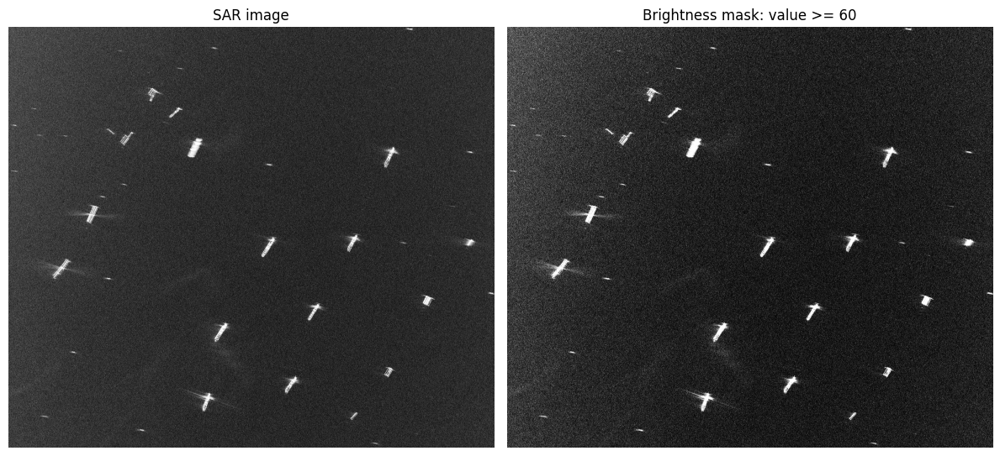

Pixels above threshold: 11489983
Fraction of valid pixels above threshold: 0.15045010508673867

Threshold: 80


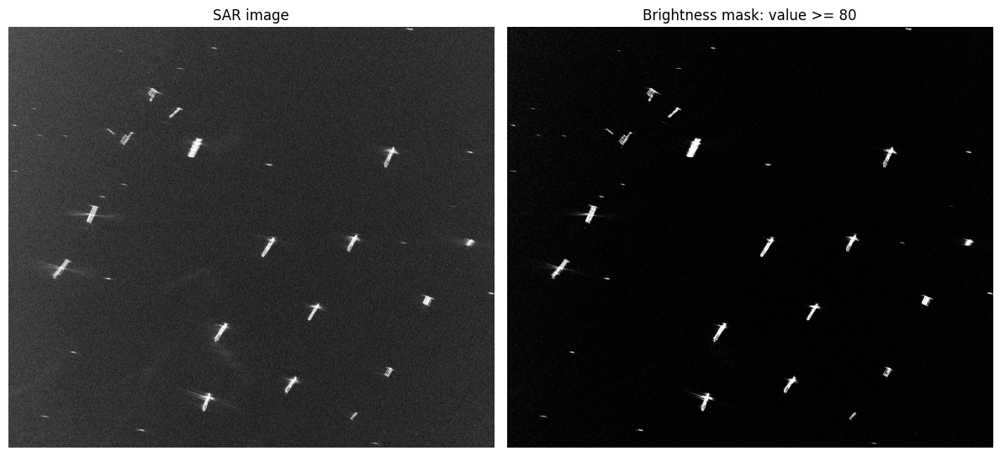

Pixels above threshold: 1437115
Fraction of valid pixels above threshold: 0.018817617290793943

Threshold: 100


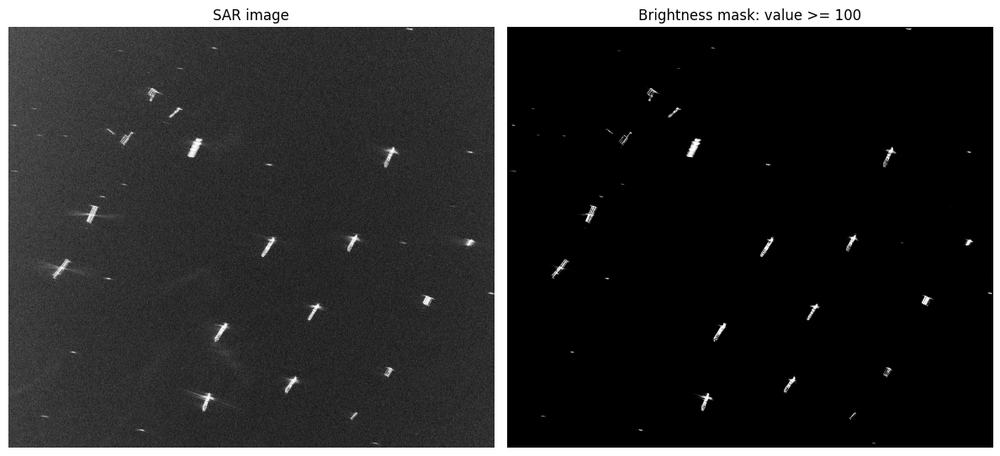

Pixels above threshold: 323454
Fraction of valid pixels above threshold: 0.004235314211581164

Threshold: 120


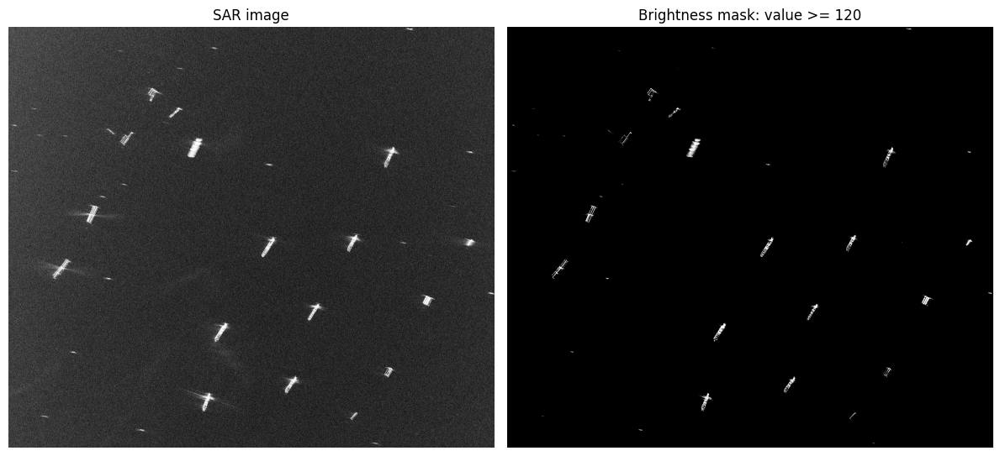

Pixels above threshold: 222481
Fraction of valid pixels above threshold: 0.0029131713971902924

Threshold: 140


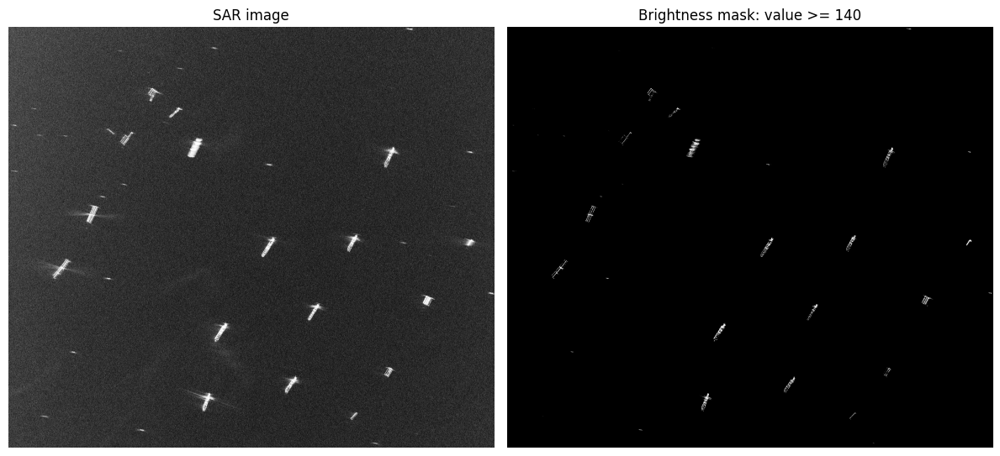

Pixels above threshold: 139902
Fraction of valid pixels above threshold: 0.001831880047328609

Threshold: 160


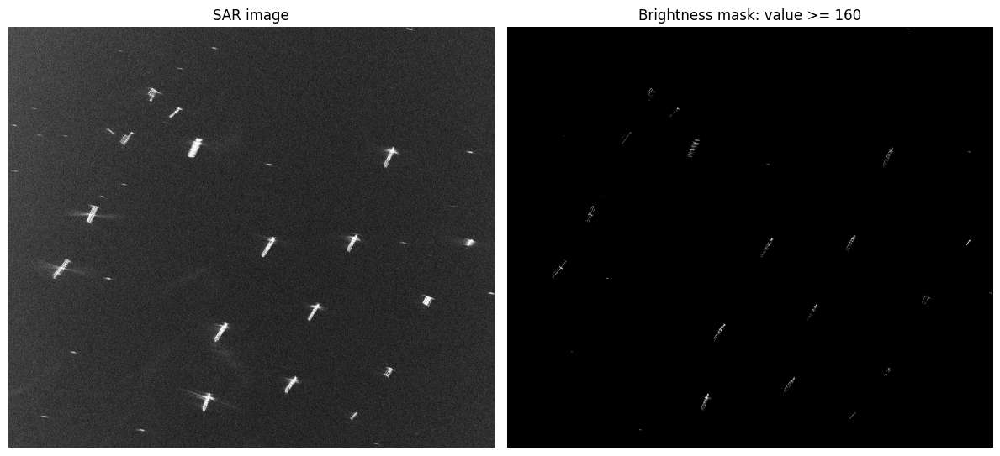

Pixels above threshold: 72849
Fraction of valid pixels above threshold: 0.0009538865031796675

Threshold: 180


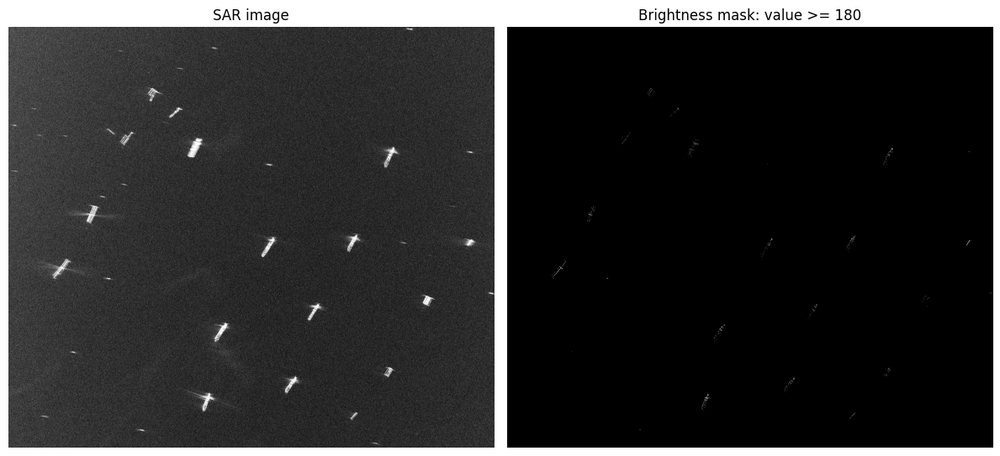

Pixels above threshold: 29482
Fraction of valid pixels above threshold: 0.0003860379948488374


In [13]:
###TRY SOME DIFFERENT THRESHOLDS HERE. PUT YOUR THRESHOLDS IN THE BRACKETS
for threshold in [60, 80, 100, 120, 140, 160, 180]:
    print("\nThreshold:", threshold)
    _ = plot_threshold_mask(arr, threshold=threshold, nodata=nodata)

QUESTION (10 pts):
Which threshold seems too low? 60
Which threshold seems too high? 170
Which threshold would you choose for a first-pass detector?
What types of ships or ship parts might be missed by a high threshold?

ANSWER: A threshold around 60 is too low because it includes a lot of ocean clutter and noise, causing many false detections. A threshold around 170 is too high because it only keeps the brightest pixels and starts removing weaker ship returns.
For a first-pass detector, a threshold between around 100–140 is the best because it balances detection of ships while limiting noise.
A high threshold can miss smaller ships, low-reflectivity vessels, and weaker parts of larger ships (such as edges, bow/stern, or non-metallic sections) that do not reflect radar strongly.

In [14]:
def connected_component_table(mask, arr):
    labeled, n_labels = label(mask)
    objects = find_objects(labeled)
    img = arr.astype("float32")
    rows = []

    for object_id, slc in enumerate(objects, start=1):
        if slc is None:
            continue
        rr, cc = slc
        component = labeled[slc] == object_id
        y0, y1 = rr.start, rr.stop
        x0, x1 = cc.start, cc.stop
        area = int(component.sum())
        width = x1 - x0
        height = y1 - y0
        values = img[slc][component]
        rows.append({
            "object_id": object_id,
            "x0": x0, "y0": y0, "x1": x1, "y1": y1,
            "width_pix": width, "height_pix": height, "area_pix": area,
            "mean_brightness": float(np.nanmean(values)),
            "max_brightness": float(np.nanmax(values)),
        })

    table = pd.DataFrame(rows)
    if len(table):
        table = table.sort_values(["max_brightness", "area_pix"], ascending=False).reset_index(drop=True)
    return table, labeled

threshold = 100
img = arr.astype("float32")
valid = np.isfinite(img) & (img != nodata)
mask = (img >= threshold) & valid
component_table, labeled = connected_component_table(mask, arr)
print("Number of connected components:", len(component_table))
display(component_table.head(20))

Number of connected components: 6795


,object_id,x0,y0,x1,y1,width_pix,height_pix,area_pix,mean_brightness,max_brightness
0,3421,4887,4084,5144,4457,257,373,22088,141.993073,255.0
1,6060,3738,7084,3965,7430,227,346,21975,148.802414,255.0
2,2754,1506,3460,1753,3802,247,342,20445,137.180634,255.0
3,4100,854,4527,1188,4862,334,335,18993,139.647873,255.0
4,1887,7254,2319,7497,2721,243,402,18730,145.751892,255.0
5,3338,6541,4032,6754,4344,213,312,17282,145.257782,255.0
6,3537,8842,4121,8992,4246,150,125,8066,140.005203,255.0
7,695,2700,1197,2922,1349,222,152,6500,143.544159,255.0
8,5752,5335,6768,5571,7075,236,307,16751,144.014740,252.0
9,4673,879,4869,914,4882,35,13,228,151.679825,251.0


QUESTION (5 pts): Look at the number of connected components, printed before the table. Does that match with the approximate number of ships you think you should see? NOTE: The above and below cells only plot connected components and bounding boxes for a small subset of what was found. You can play with these values, but the image might get hard to read.

ANSWER: The number of connected components does not perfectly match the number of ships you would expect to see. In many cases, one ship can be split into multiple connected components due to speckle and varying backscatter, while in other cases several nearby ships can merge into a single component. As a result, the component count is usually an over- or under-estimate of the actual number of ships in the scene.

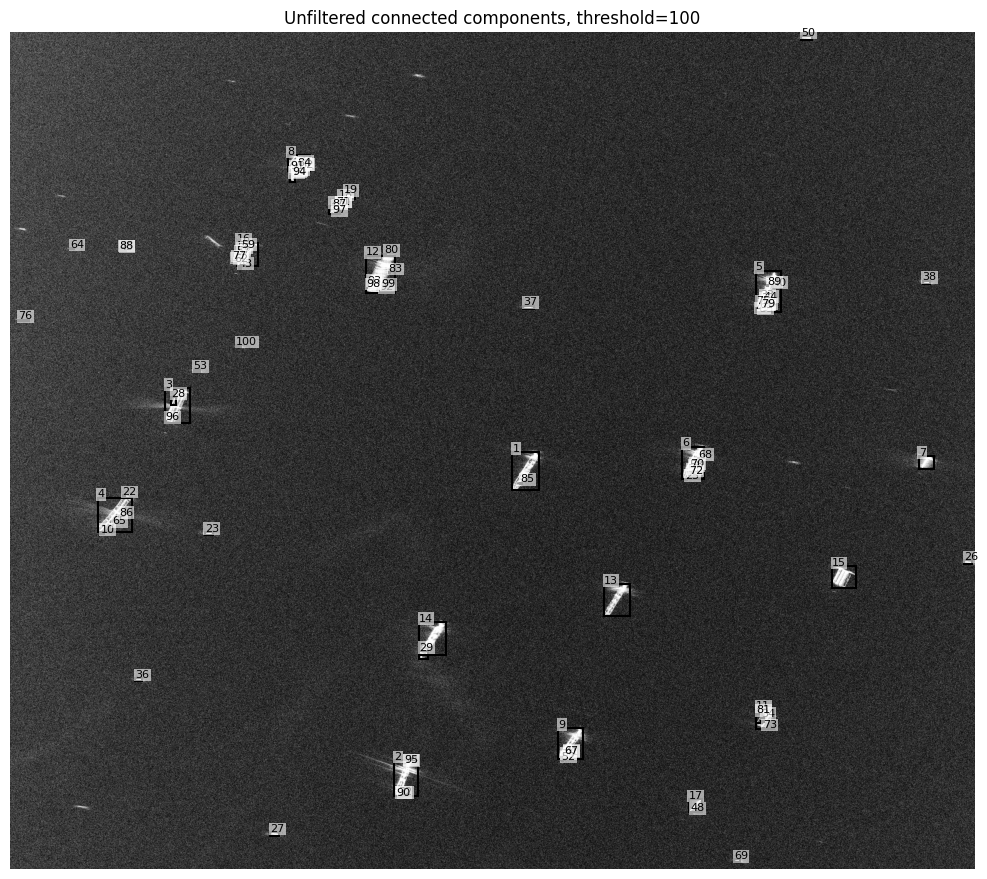

In [15]:
def plot_boxes(arr, candidates, title="Candidate boxes", nodata=0, pmin=1, pmax=99.8, max_boxes=100, label_boxes=True, figsize=(10, 10)):
    disp = display_sar(arr, pmin=pmin, pmax=pmax, nodata=nodata)
    fig, ax = plt.subplots(figsize=figsize)
    ax.imshow(disp, cmap="gray")
    ax.set_title(title)

    for i, (_, r) in enumerate(candidates.head(max_boxes).iterrows(), start=1):
        rect = Rectangle((r["x0"], r["y0"]), r["x1"] - r["x0"], r["y1"] - r["y0"], fill=False, linewidth=1.5)
        ax.add_patch(rect)
        if label_boxes:
            ax.text(r["x0"], max(r["y0"] - 3, 0), str(i), fontsize=8, bbox=dict(facecolor="white", alpha=0.6, edgecolor="none", pad=1))

    ax.axis("off")
    plt.tight_layout()
    plt.show()

plot_boxes(arr, component_table.head(100), title=f"Unfiltered connected components, threshold={threshold}", nodata=nodata)

In [16]:
def detect_ship_candidates_precompiled(arr, threshold=100, nodata=0, min_area=4, max_area=500, max_width=120, max_height=120, min_aspect=0.1, max_aspect=10.0, do_closing=True):
    img = arr.astype("float32")
    valid = np.isfinite(img)
    if nodata is not None:
        valid &= img != nodata

    mask = (img >= threshold) & valid
    if do_closing:
        mask = binary_closing(mask, structure=np.ones((2, 2)))

    labeled, n_labels = label(mask)
    objects = find_objects(labeled)
    rows = []

    for object_id, slc in enumerate(objects, start=1):
        if slc is None:
            continue
        rr, cc = slc
        component = labeled[slc] == object_id
        area = int(component.sum())
        if area < min_area or area > max_area:
            continue

        y0, y1 = rr.start, rr.stop
        x0, x1 = cc.start, cc.stop
        width = x1 - x0
        height = y1 - y0
        aspect = width / max(height, 1)

        if width > max_width or height > max_height:
            continue
        if aspect < min_aspect or aspect > max_aspect:
            continue

        values = img[slc][component]
        rows.append({
            "candidate_id": object_id,
            "x0": x0, "y0": y0, "x1": x1, "y1": y1,
            "center_x": 0.5 * (x0 + x1),
            "center_y": 0.5 * (y0 + y1),
            "width_pix": width, "height_pix": height, "area_pix": area, "aspect": aspect,
            "mean_brightness": float(np.nanmean(values)),
            "max_brightness": float(np.nanmax(values)),
        })

    candidates = pd.DataFrame(rows)
    if len(candidates):
        candidates = candidates.sort_values(["max_brightness", "area_pix"], ascending=False).reset_index(drop=True)
    return candidates, mask, labeled

Detected candidates: 1284


,candidate_id,x0,y0,x1,y1,center_x,center_y,width_pix,height_pix,area_pix,aspect,mean_brightness,max_brightness
0,3767,879,4869,914,4882,896.5,4875.5,35,13,246,2.692308,146.544708,251.0
1,1995,7303,2618,7344,2684,7323.5,2651.0,41,66,473,0.621212,139.439743,215.0
2,3237,6570,4345,6585,4359,6577.5,4352.0,15,14,134,1.071429,147.029846,212.0
3,2036,7306,2671,7316,2678,7311.0,2674.5,10,7,46,1.428571,142.826080,208.0
4,5206,3777,7426,3795,7437,3786.0,7431.5,18,11,142,1.636364,144.887329,205.0
5,1982,7303,2590,7309,2599,7306.0,2594.5,6,9,35,0.666667,153.600006,205.0
6,4532,7305,6659,7337,6709,7321.0,6684.0,32,50,375,0.640000,133.664001,204.0
7,2077,7285,2724,7297,2733,7291.0,2728.5,12,9,83,1.333333,151.277115,197.0
8,4809,5390,7032,5404,7043,5397.0,7037.5,14,11,66,1.272727,141.515152,196.0
9,859,2765,1370,2790,1391,2777.5,1380.5,25,21,179,1.190476,134.290497,195.0


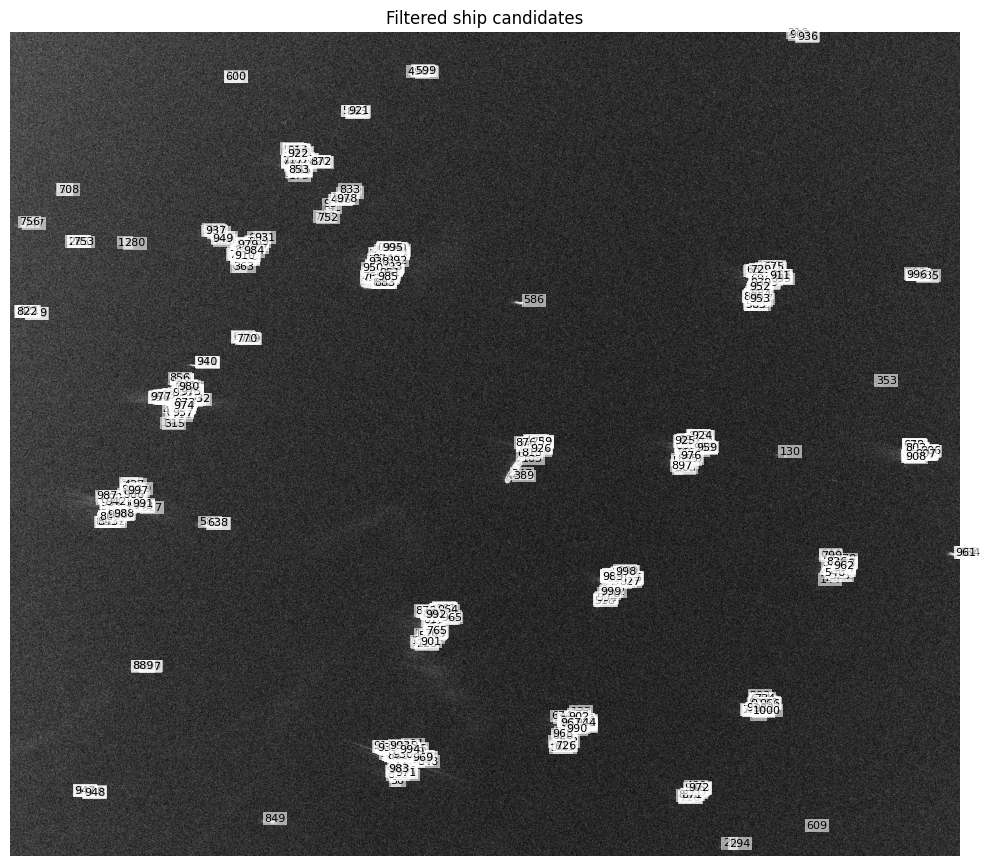

In [17]:
test_candidates, test_mask, test_labeled = detect_ship_candidates_precompiled(arr, threshold=100, nodata=nodata, min_area=4, max_area=500, max_width=120, max_height=120, do_closing=True)
print("Detected candidates:", len(test_candidates))
display(test_candidates.head(30))
plot_boxes(arr, test_candidates, title="Filtered ship candidates", nodata=nodata, max_boxes=1000)


Settings: {'threshold': 100, 'min_area': 3, 'max_area': 800}
Candidate count: 1635


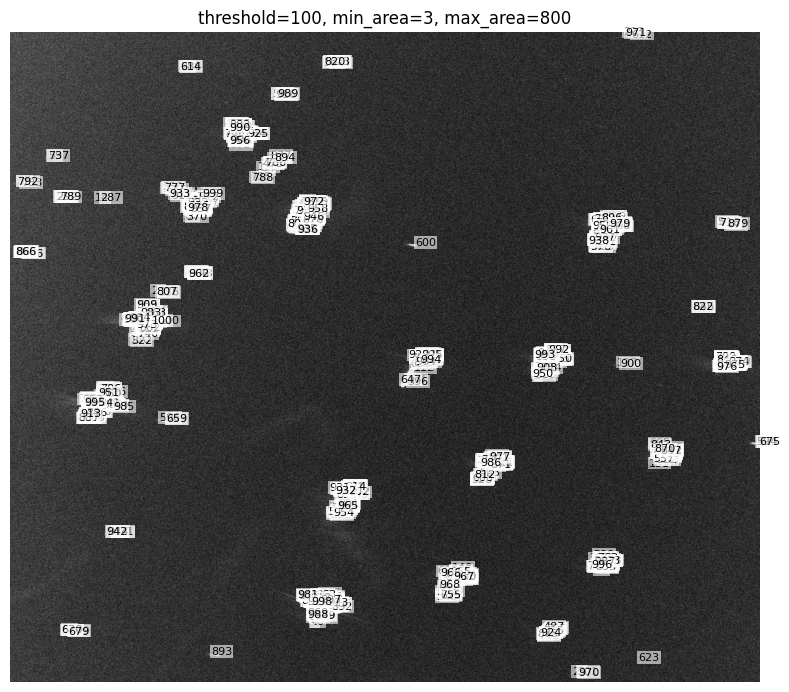


Settings: {'threshold': 100, 'min_area': 4, 'max_area': 500}
Candidate count: 1284


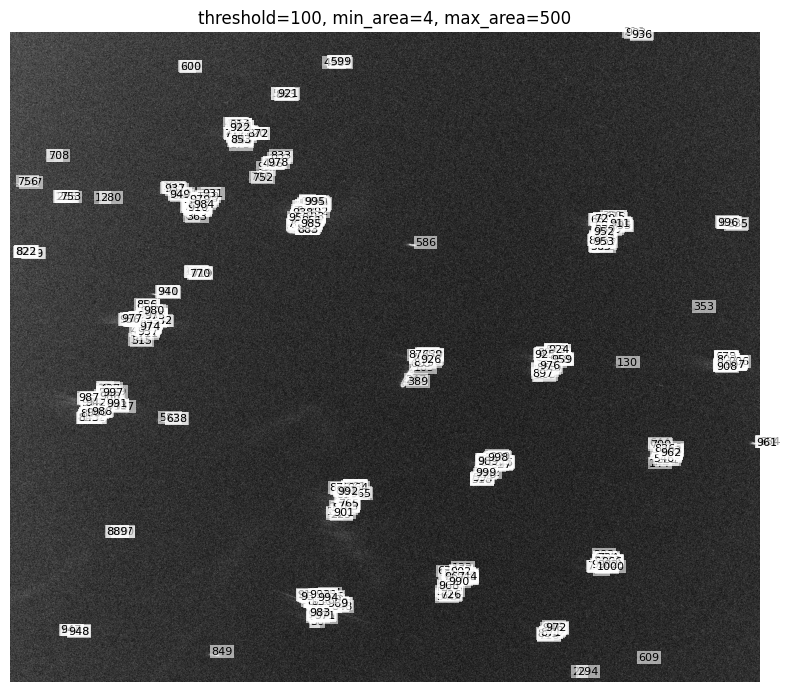


Settings: {'threshold': 80, 'min_area': 4, 'max_area': 500}
Candidate count: 65638


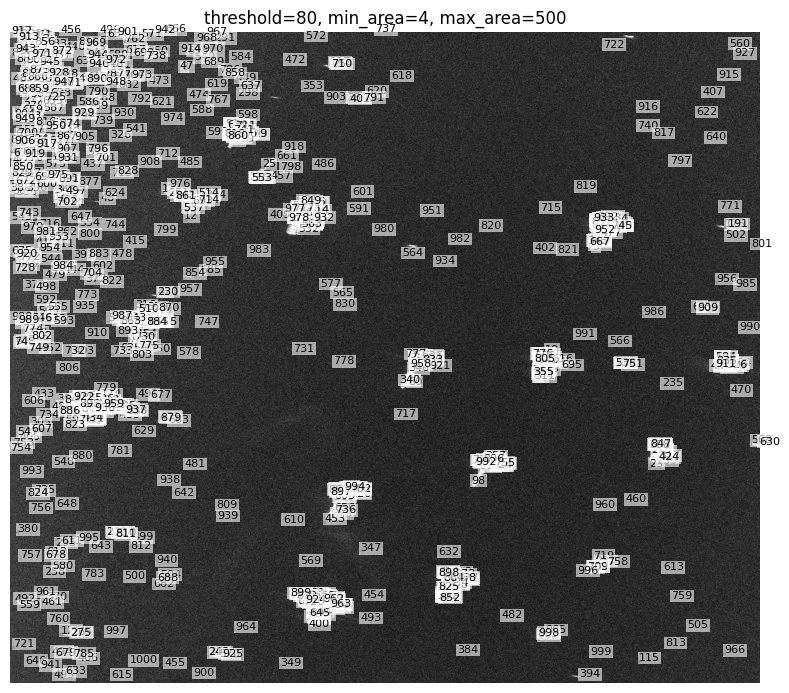

In [18]:
settings = [
    {"threshold": 100, "min_area": 3, "max_area": 800},
    {"threshold": 100, "min_area": 4, "max_area": 500},
    {"threshold": 80, "min_area": 4, "max_area": 500},
]

for s in settings:
    candidates, _, _ = detect_ship_candidates_precompiled(arr, nodata=nodata, max_width=120, max_height=120, do_closing=True, **s)
    print("\nSettings:", s)
    print("Candidate count:", len(candidates))
    plot_boxes(arr, candidates, title=f"threshold={s['threshold']}, min_area={s['min_area']}, max_area={s['max_area']}", nodata=nodata, max_boxes=1000, figsize=(8, 8))

QUESTION (10 pts):
1. Which settings produce too many false positives?
2. Which settings miss obvious ships? 
3. Do larger ships split into multiple components?

ANSWER: The setting with threshold = 80 and max_area = 500 produces too many false positives because the lower threshold includes a lot of ocean clutter and noise, creating many small non-ship detections.
The settings with threshold 100 and stricter area limits min_area = 4, max_area = 500 tend to miss some obvious ships, especially larger or weaker-return vessels that get filtered out due to area or intensity constraints.
Larger ships often split into multiple connected components because different parts of the ship reflect radar differently and speckle noise breaks them into separate bright regions.

QUESTION (30 pts): Adjust the detect_ship_candidates_precompiled() function above to group these candidate detections into individual ships. Right now, single ships are clusters of several to many different individual pieces - this is expected becasue SAR images of individual structures like boats are not uniformly illuminated, meaning there will often be gaps in bright spots. I found the scipy package binary_dilation to be very useful to add here. You will need to adjust the binary_closing if statement to first do binary_dilation, while also getting the structure correct with the merge_distance_pix variable. When compiling the summary statistics table at the end, it will be important to use the original bright pixels inside your grouped boxes to compute brightness, not the dilated pixels. The following code block will help with that:

    original_component_pixels = img[y0:y1, x0:x1]
    original_valid = valid[y0:y1, x0:x1]
    original_bright = (original_component_pixels >= threshold) & original_valid

In [19]:
from scipy.ndimage import binary_dilation


def detect_ship_candidates_grouped(
    arr,
    threshold=100,
    nodata=0,
    min_area=4,
    max_area=50000,
    max_width=600,
    max_height=600,
    min_aspect=0.05,
    max_aspect=30.0,
    merge_distance_pix=15,
    do_closing=True,
):
###YOUR CODE HERE. COPY THE ORIGINAL detect_ship_candidates FUNCTION, AND ADJUST TO DO THE GROUPING
    img = arr.astype("float32")

    # validity mask
    valid = np.isfinite(img)
    if nodata is not None:
        valid &= img != nodata

    # STEP 1: initial bright pixel mask
    mask = (img >= threshold) & valid

    # STEP 2: group nearby ship fragments using dilation
    if merge_distance_pix > 0:
        struct = np.ones((merge_distance_pix, merge_distance_pix), dtype=bool)
        mask = binary_dilation(mask, structure=struct)

    # optional light closing after dilation
    if do_closing:
        mask = binary_closing(mask, structure=np.ones((2, 2)))

    # STEP 3: connected components on grouped mask
    labeled, n_labels = label(mask)
    objects = find_objects(labeled)

    rows = []

    for object_id, slc in enumerate(objects, start=1):
        if slc is None:
            continue

        rr, cc = slc
        component = labeled[slc] == object_id

        area = int(component.sum())
        if area < min_area or area > max_area:
            continue

        y0, y1 = rr.start, rr.stop
        x0, x1 = cc.start, cc.stop

        width = x1 - x0
        height = y1 - y0

        if width > max_width or height > max_height:
            continue

        aspect = width / max(height, 1)
        if aspect < min_aspect or aspect > max_aspect:
            continue

        # IMPORTANT: compute stats from ORIGINAL image (not dilated mask)
        original_component_pixels = img[y0:y1, x0:x1]
        original_valid = valid[y0:y1, x0:x1]
        original_bright = (original_component_pixels >= threshold) & original_valid

        values = original_component_pixels[original_bright]

        # skip empty detections
        if len(values) == 0:
            continue

        rows.append({
            "candidate_id": object_id,
            "x0": x0, "y0": y0, "x1": x1, "y1": y1,
            "center_x": 0.5 * (x0 + x1),
            "center_y": 0.5 * (y0 + y1),
            "width_pix": width,
            "height_pix": height,
            "area_pix": area,
            "aspect": aspect,
            "mean_brightness": float(np.nanmean(values)),
            "max_brightness": float(np.nanmax(values)),
        })

    candidates = pd.DataFrame(rows)

    if len(candidates):
        candidates = candidates.sort_values(
            ["max_brightness", "area_pix"],
            ascending=False
        ).reset_index(drop=True)

    return candidates, mask, labeled

candidate rows: 48
 candidate_id   x0   y0   x1   y1  center_x  center_y  width_pix  height_pix  area_pix   aspect  mean_brightness  max_brightness
           31  841 4484 1208 4890    1024.5    4687.0        367         406     51921 0.903941       155.329758           255.0
           24 1424 3450 1761 3817    1592.5    3633.5        337         367     51386 0.918256       149.780960           255.0
           43 3656 7057 3986 7445    3821.0    7251.0        330         388     51097 0.850515       158.421387           255.0
           15 7242 2310 7513 2742    7377.5    2526.0        271         432     46199 0.627315       154.966537           255.0
           28 4877 4056 5157 4466    5017.0    4261.0        280         410     43808 0.682927       150.980026           255.0
           27 6531 4004 6791 4368    6661.0    4186.0        260         364     39289 0.714286       154.809952           255.0
            6 2683 1182 2955 1466    2819.0    1324.0        272         284  

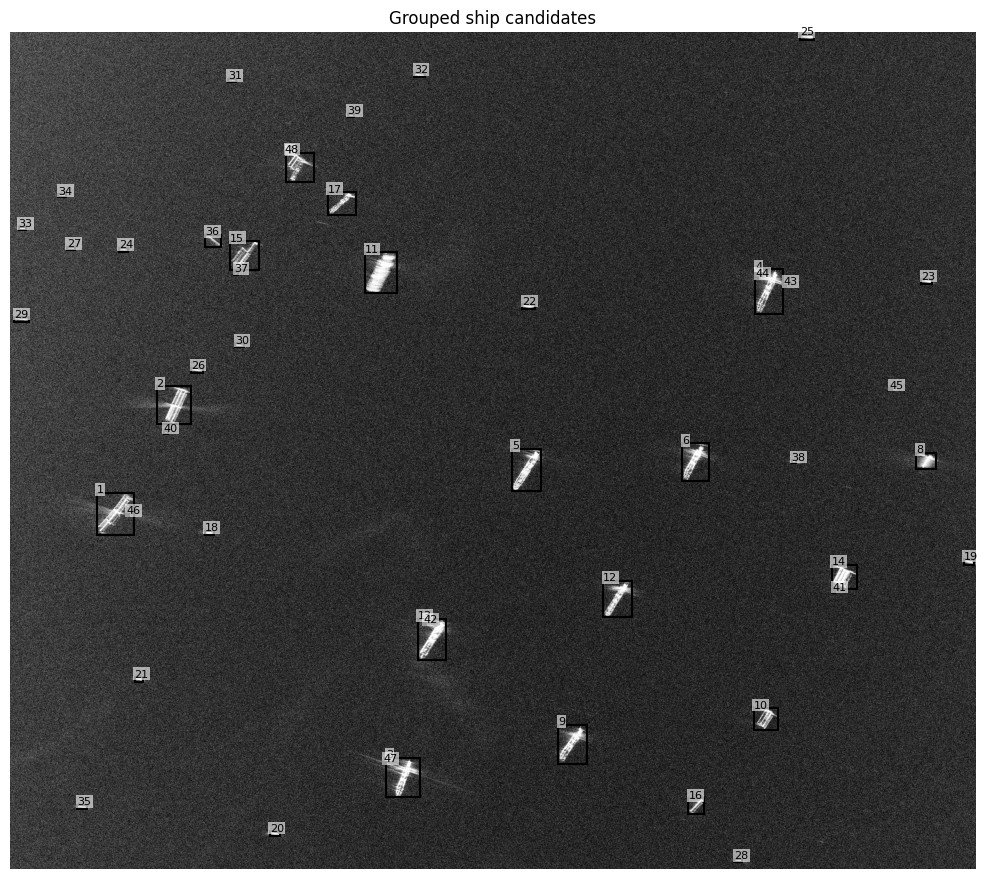

In [21]:
candidates, mask, labeled = detect_ship_candidates_grouped(
    arr,
    threshold=120,
    nodata=0,
    min_area=20,
    max_area=70000,
    max_width=700,
    max_height=700,
    merge_distance_pix=20,
)
print("candidate rows:", len(candidates))
print(candidates.head(30).to_string(index=False))

plot_boxes(
    arr,
    candidates,
    title="Grouped ship candidates",
    nodata=0,
    max_boxes=1000,
)

QUESTION (20 pts): Write 1 paragraph describing which parameters you settled on and why.
- Which threshold and size filters did you choose?
- Did your detector mostly find ships, or did it also detect clutter?
- What false positives remain? What false negatives remain?
- What types of ships might be missed?

ANSWER: I settled on a moderate threshold around 120, with size filters such as min_area ≈ 20 and max_area ≈ 70,000, because this combination reduced ocean noise while still preserving bright ship returns. I also used a relatively large merge_distance_pix so that fragmented bright scatterers belonging to the same vessel were grouped into a single detection. Overall, the detector mostly found real ships, though some clutter from strong sea speckle and bright artifacts near waves or coastline still produced a few false positives. Remaining false negatives mainly include smaller ships and low-backscatter vessels, which fall below the threshold or get removed by area filtering, while false positives often come from speckle clusters or closely spaced bright ocean returns. Larger or more complex ships are generally detected, but very dim ships or those partially occluded by noise or low reflectivity materials may still be missed.